<img src="udc1.png" alt="UDC"/>

# Notebook pour le traitement et préséléction d'images(déchets). 

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

In [3]:
import outils

In [4]:
df = outils.Load_data.load_object("dataset2.zip")

In [5]:
df.encodage()

In [6]:
(X_train, _),( _, _) = df.create_data(test_size=0.1)

In [7]:
from tqdm import tqdm

def resize_images(X, target_size=(64, 64), batch_size=128):
    n_samples = len(X)
    resized_list = []

    for i in tqdm(range(0, n_samples, batch_size), desc="Resizing images"):
        batch = X[i:i + batch_size]
        batch = tf.convert_to_tensor(batch, dtype=tf.float32)
        resized_batch = tf.image.resize(batch, target_size, method='bilinear')
        resized_list.append(resized_batch.numpy())

    X_resized = np.concatenate(resized_list, axis=0)
    return X_resized.astype(np.float32)

In [8]:
X_train_  = resize_images(X_train, target_size=(64, 64), batch_size=128)

print("Forme initiale :", X_train.shape)
print("Forme redimensionnée :", X_train_.shape)


Resizing images: 100%|█████████████████████████████████████████████████████████████████| 86/86 [00:59<00:00,  1.45it/s]


Forme initiale : (10924, 240, 240, 3)
Forme redimensionnée : (10924, 64, 64, 3)


In [9]:
IMG_HEIGHT = 64
IMG_WIDTH = 64
IMG_CHANNELS = 3
LATENT_DIM = 128
BATCH_SIZE = 32 
EPOCHS = 500    

In [10]:
def build_generator():
    model = keras.Sequential([
        # Couche d'entrée
        layers.Dense(8 * 8 * 128, use_bias=False, input_shape=(LATENT_DIM,)),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        layers.Reshape((8, 8, 128)),
        
        # Upsampling progressif
        layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        
        layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        
        layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False),
        layers.BatchNormalization(),
        layers.LeakyReLU(0.2),
        
        # Couche de sortie
        layers.Conv2DTranspose(3, (5, 5), strides=(1, 1), padding='same', 
                              use_bias=False, activation='tanh')  # Sortie entre -1 et 1
    ], name="generator")
    return model


In [11]:
def build_discriminator():
    model = keras.Sequential([
        # Couche d'entrée
        layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', 
                     input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS)),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.3),
        
        # Downsampling
        layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.3),
        
        layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'),
        layers.LeakyReLU(0.2),
        layers.Dropout(0.3),
        
        # Classification
        layers.GlobalAveragePooling2D(),
        layers.Dense(64, activation="relu", kernel_regularizer=keras.regularizers.l2(0.02)),
        layers.Dense(1, activation='sigmoid')  # Sortie probabilité
    ], name="discriminator")
    return model

In [12]:
class GAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super().__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim
        
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.d_acc_metric = keras.metrics.BinaryAccuracy(name="d_acc")

    @property
    def metrics(self):
        return [self.g_loss_metric, self.d_loss_metric, self.d_acc_metric]

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super().compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]
        
        # ===== ENTRAÎNEMENT DISCRIMINATEUR =====
        with tf.GradientTape() as d_tape:
            # Générer des images fausses
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            generated_images = self.generator(random_latent_vectors, training=True)
            
            # Combiner images réelles et générées
            combined_images = tf.concat([generated_images, real_images], axis=0)
            
            # Labels : 0 pour fausses, 1 pour réelles
            labels = tf.concat([
                tf.zeros((batch_size, 1)),  # Images générées = fausses
                tf.ones((batch_size, 1))    # Images réelles = vraies
            ], axis=0)
            
            labels += 0.05 * tf.random.uniform(tf.shape(labels))
            predictions = self.discriminator(combined_images, training=True)
            d_loss = self.loss_fn(labels, predictions)
        d_grads = d_tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(zip(d_grads, self.discriminator.trainable_weights))
        
        # ===== ENTRAÎNEMENT GÉNÉRATEUR =====
        with tf.GradientTape() as g_tape:
            # Générer de nouvelles images
            random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))
            generated_images = self.generator(random_latent_vectors, training=True)
            
            # Labels trompeurs : faire croire que les images générées sont réelles
            misleading_labels = tf.ones((batch_size, 1))
            
            # Prédictions du discriminateur sur images générées
            predictions = self.discriminator(generated_images, training=True)
            
            # Loss du générateur
            g_loss = self.loss_fn(misleading_labels, predictions)
        
        # Mise à jour du générateur
        g_grads = g_tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(zip(g_grads, self.generator.trainable_weights))
        
        # Mise à jour des métriques
        self.g_loss_metric.update_state(g_loss)
        self.d_loss_metric.update_state(d_loss)
        
        # Calcul de l'accuracy du discriminateur
        real_predictions = self.discriminator(real_images, training=False)
        fake_predictions = self.discriminator(generated_images, training=False)
        real_labels = tf.ones_like(real_predictions)
        fake_labels = tf.zeros_like(fake_predictions)
        
        all_predictions = tf.concat([real_predictions, fake_predictions], axis=0)
        all_labels = tf.concat([real_labels, fake_labels], axis=0)
        self.d_acc_metric.update_state(all_labels, all_predictions)
        
        return {
            "g_loss": self.g_loss_metric.result(),
            "d_loss": self.d_loss_metric.result(),
            "d_acc": self.d_acc_metric.result()
        }

    def generate_images(self, num_images=16):
        """Génère des images avec le générateur"""
        random_latent_vectors = tf.random.normal(shape=(num_images, self.latent_dim))
        generated_images = self.generator(random_latent_vectors, training=False)
        return (generated_images + 1) / 2  # Conversion [-1,1] -> [0,1]

In [13]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=16, latent_dim=128, interval=10):
        self.num_img = num_img
        self.latent_dim = latent_dim
        self.interval = interval

    def on_epoch_end(self, epoch, logs=None):
        if epoch % self.interval == 0:
            generated_images = self.model.generate_images(self.num_img)
            
            plt.figure(figsize=(8, 8))
            for i in range(self.num_img):
                plt.subplot(4, 4, i + 1)
                plt.imshow(generated_images[i])
                plt.axis("off")
            plt.suptitle(f"Epoch {epoch}")
            plt.tight_layout()
            plt.show()

In [14]:
def prepare_dataset(X_train, batch_size=32):
    X_train = (X_train.astype(np.float32) - 127.5) / 127.5
    
    dataset = tf.data.Dataset.from_tensor_slices(X_train)
    dataset = dataset.shuffle(5000)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    
    return dataset

In [15]:
generator = build_generator()
discriminator = build_discriminator()

C:\Users\hp\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\core\dense.py:92: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
C:\Users\hp\AppData\Roaming\Python\Python313\site-packages\keras\src\layers\convolutional\base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [16]:
generator.summary()

Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense (Dense)                        │ (None, 8192)                │       1,048,576 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 8192)                │          32,768 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu (LeakyReLU)              │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 8, 8, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 16, 16, 128)         │         409,600 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 16, 16, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_1 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 32, 32, 64)          │         204,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 32, 32, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_2 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_2 (Conv2DTranspose) │ (None, 64, 64, 32)          │          51,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 64, 64, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_3 (LeakyReLU)            │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_3 (Conv2DTranspose) │ (None, 64, 64, 3)           │           2,400 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,750,240 (6.68 MB)

 Trainable params: 1,733,408 (6.61 MB)

 Non-trainable params: 16,832 (65.75 KB)

In [17]:
discriminator.summary()

Model: "discriminator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 32, 32, 64)          │           4,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_4 (LeakyReLU)            │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 16, 16, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_5 (LeakyReLU)            │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 8, 8, 256)           │         819,456 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_6 (LeakyReLU)            │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 8, 8, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 64)                  │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │              65 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,045,761 (3.99 MB)

 Trainable params: 1,045,761 (3.99 MB)

 Non-trainable params: 0 (0.00 B)

In [18]:
dataset =  prepare_dataset(X_train_, batch_size=16)

Début de l'entraînement...
Timestamp: 20251031_1048
Modèle sera sauvegardé sous: model_dct_gan_20251031_1048.keras
Epoch 1/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 546ms/step - d_acc: 0.8570 - d_loss: 0.5447 - g_loss: 0.9056  
Epoch 1: g_loss improved from None to 0.85666, saving model to model_dct_gan_20251031_1048.keras


C:\Users\hp\AppData\Roaming\Python\Python313\site-packages\keras\src\saving\saving_api.py:107: UserWarning: You are saving a model that has not yet been built. It might not contain any weights yet. Consider building the model first by calling it on some data.
  return saving_lib.save_model(model, filepath)


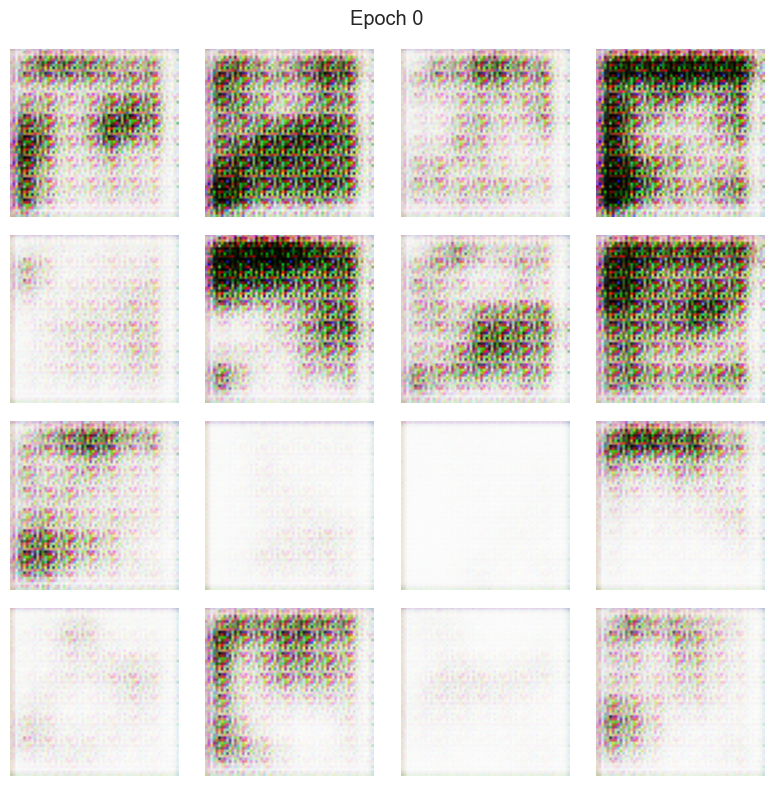

683/683 ━━━━━━━━━━━━━━━━━━━━ 391s 551ms/step - d_acc: 0.7464 - d_loss: 0.5974 - g_loss: 0.8567 - learning_rate: 0.0010
Epoch 2/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 680ms/step - d_acc: 0.5966 - d_loss: 0.6897 - g_loss: 0.7249  
Epoch 2: g_loss improved from 0.85666 to 0.71728, saving model to model_dct_gan_20251031_1048.keras
683/683 ━━━━━━━━━━━━━━━━━━━━ 465s 681ms/step - d_acc: 0.5990 - d_loss: 0.6863 - g_loss: 0.7173 - learning_rate: 0.0010
Epoch 3/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 570ms/step - d_acc: 0.5288 - d_loss: 0.6926 - g_loss: 0.6681  
Epoch 3: g_loss improved from 0.71728 to 0.66478, saving model to model_dct_gan_20251031_1048.keras
683/683 ━━━━━━━━━━━━━━━━━━━━ 390s 571ms/step - d_acc: 0.5241 - d_loss: 0.6921 - g_loss: 0.6648 - learning_rate: 0.0010
Epoch 4/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 572ms/step - d_acc: 0.5608 - d_loss: 0.6857 - g_loss: 0.6695  
Epoch 4: g_loss did not improve from 0.66478
683/683 ━━━━━━━━━━━━━━━━━━━━ 391s 572ms/step - d_acc: 0.5496 - d_loss: 0.6869

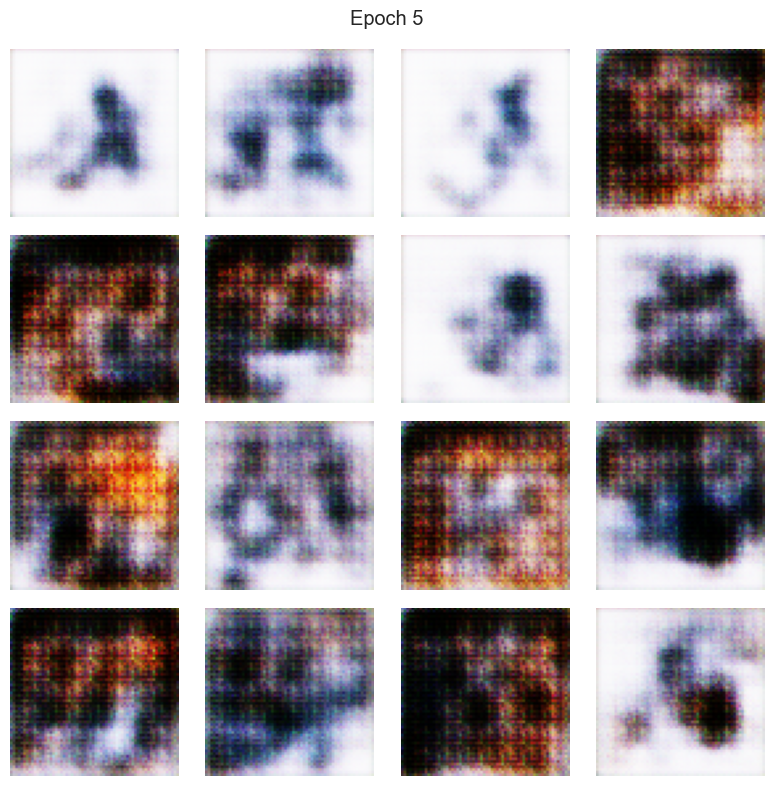

683/683 ━━━━━━━━━━━━━━━━━━━━ 526s 770ms/step - d_acc: 0.5354 - d_loss: 0.6901 - g_loss: 0.6630 - learning_rate: 0.0010
Epoch 7/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step - d_acc: 0.5493 - d_loss: 0.6870 - g_loss: 0.6641  
Epoch 7: g_loss did not improve from 0.66297
683/683 ━━━━━━━━━━━━━━━━━━━━ 364s 449ms/step - d_acc: 0.5455 - d_loss: 0.6882 - g_loss: 0.6635 - learning_rate: 0.0010
Epoch 8/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 488ms/step - d_acc: 0.5369 - d_loss: 0.6885 - g_loss: 0.6559  
Epoch 8: g_loss improved from 0.66297 to 0.65598, saving model to model_dct_gan_20251031_1048.keras
683/683 ━━━━━━━━━━━━━━━━━━━━ 335s 490ms/step - d_acc: 0.5386 - d_loss: 0.6899 - g_loss: 0.6560 - learning_rate: 0.0010
Epoch 9/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step - d_acc: 0.5545 - d_loss: 0.6864 - g_loss: 0.6608  
Epoch 9: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 334s 489ms/step - d_acc: 0.5628 - d_loss: 0.6851 - g_loss: 0.6650 - learning_rate: 0.0010
Epoch 10/200


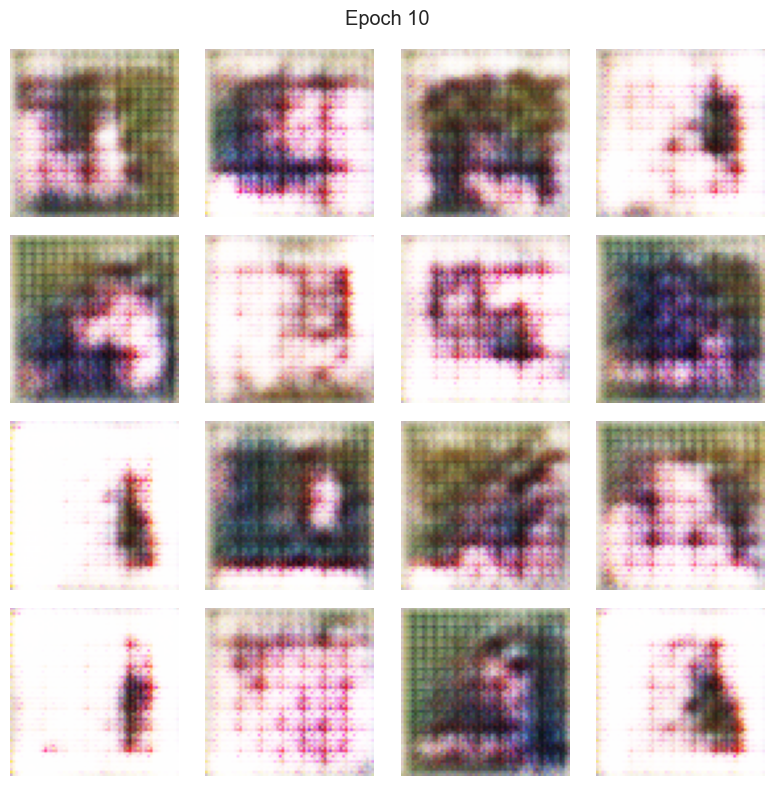

683/683 ━━━━━━━━━━━━━━━━━━━━ 314s 459ms/step - d_acc: 0.5964 - d_loss: 0.6761 - g_loss: 0.6643 - learning_rate: 0.0010
Epoch 12/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 439ms/step - d_acc: 0.6668 - d_loss: 0.6615 - g_loss: 0.6918  
Epoch 12: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 300s 439ms/step - d_acc: 0.6643 - d_loss: 0.6550 - g_loss: 0.6996 - learning_rate: 0.0010
Epoch 13/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 479ms/step - d_acc: 0.6872 - d_loss: 0.6519 - g_loss: 0.7221  
Epoch 13: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 327s 479ms/step - d_acc: 0.6823 - d_loss: 0.6535 - g_loss: 0.7265 - learning_rate: 0.0010
Epoch 14/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step - d_acc: 0.6586 - d_loss: 0.6508 - g_loss: 0.7713  
Epoch 14: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 310s 453ms/step - d_acc: 0.6454 - d_loss: 0.6549 - g_loss: 0.7359 - learning_rate: 0.0010
Epoch 15/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 476ms/step - d_ac

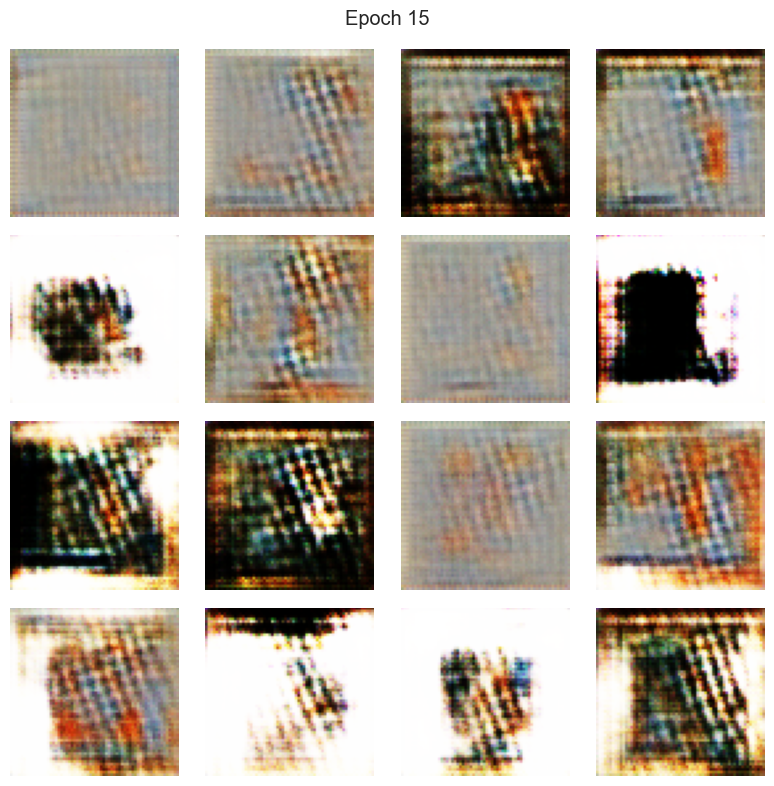

683/683 ━━━━━━━━━━━━━━━━━━━━ 316s 462ms/step - d_acc: 0.5802 - d_loss: 0.6792 - g_loss: 0.6955 - learning_rate: 0.0010
Epoch 17/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 465ms/step - d_acc: 0.5727 - d_loss: 0.6760 - g_loss: 0.6839  
Epoch 17: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 317s 465ms/step - d_acc: 0.5838 - d_loss: 0.6748 - g_loss: 0.6918 - learning_rate: 0.0010
Epoch 18/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 941ms/step - d_acc: 0.5975 - d_loss: 0.6772 - g_loss: 0.7009  
Epoch 18: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 642s 941ms/step - d_acc: 0.6042 - d_loss: 0.6757 - g_loss: 0.6987 - learning_rate: 0.0010
Epoch 19/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 951ms/step - d_acc: 0.5965 - d_loss: 0.6764 - g_loss: 0.7216 2
Epoch 19: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 649s 951ms/step - d_acc: 0.6070 - d_loss: 0.6713 - g_loss: 0.7168 - learning_rate: 0.0010
Epoch 20/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - d_acc: 

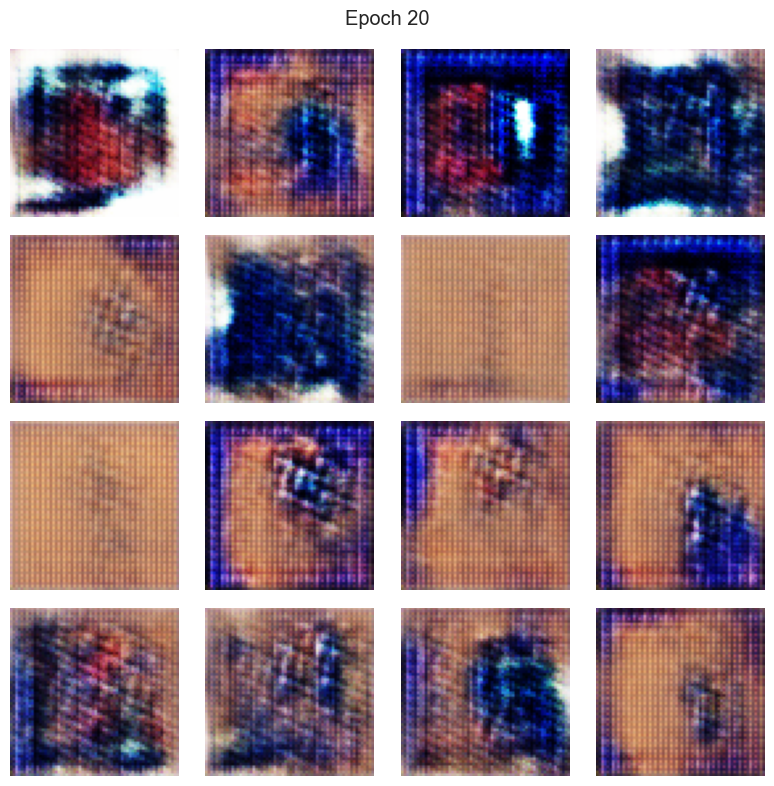

683/683 ━━━━━━━━━━━━━━━━━━━━ 333s 487ms/step - d_acc: 0.6095 - d_loss: 0.6685 - g_loss: 0.7132 - learning_rate: 0.0010
Epoch 22/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step - d_acc: 0.6166 - d_loss: 0.6647 - g_loss: 0.7301  
Epoch 22: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 328s 480ms/step - d_acc: 0.6150 - d_loss: 0.6636 - g_loss: 0.7133 - learning_rate: 0.0010
Epoch 23/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - d_acc: 0.6159 - d_loss: 0.6713 - g_loss: 0.7186  93 
Epoch 23: g_loss did not improve from 0.65598

Epoch 23: ReduceLROnPlateau reducing learning rate to 0.00020000000949949026.
683/683 ━━━━━━━━━━━━━━━━━━━━ 1541s 2s/step - d_acc: 0.6201 - d_loss: 0.6644 - g_loss: 0.7124 - learning_rate: 0.0010
Epoch 24/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - d_acc: 0.6204 - d_loss: 0.6661 - g_loss: 0.7158  
Epoch 24: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 309s 452ms/step - d_acc: 0.6220 - d_loss: 0.6652 - g_loss: 0.7163 - learnin

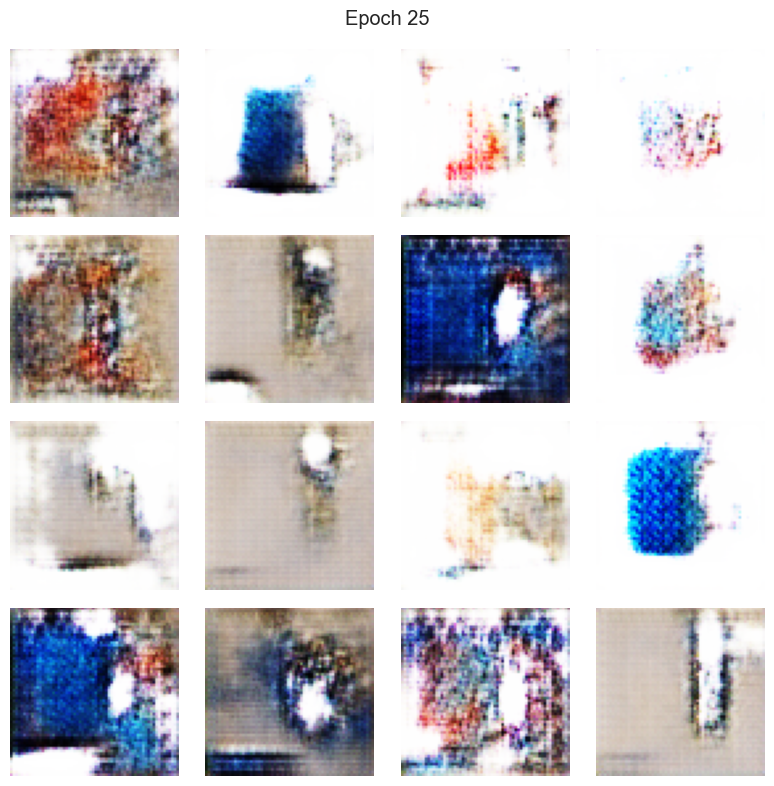

683/683 ━━━━━━━━━━━━━━━━━━━━ 3127s 5s/step - d_acc: 0.6028 - d_loss: 0.6706 - g_loss: 0.7070 - learning_rate: 2.0000e-04
Epoch 27/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - d_acc: 0.6161 - d_loss: 0.6676 - g_loss: 0.7003    2
Epoch 27: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 5616s 8s/step - d_acc: 0.6197 - d_loss: 0.6677 - g_loss: 0.6980 - learning_rate: 2.0000e-04
Epoch 28/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - d_acc: 0.6274 - d_loss: 0.6689 - g_loss: 0.7065      
Epoch 28: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 3750s 5s/step - d_acc: 0.6338 - d_loss: 0.6647 - g_loss: 0.7053 - learning_rate: 2.0000e-04
Epoch 29/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - d_acc: 0.6258 - d_loss: 0.6651 - g_loss: 0.7050  
Epoch 29: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 449s 657ms/step - d_acc: 0.6306 - d_loss: 0.6633 - g_loss: 0.7060 - learning_rate: 2.0000e-04
Epoch 30/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 667ms/

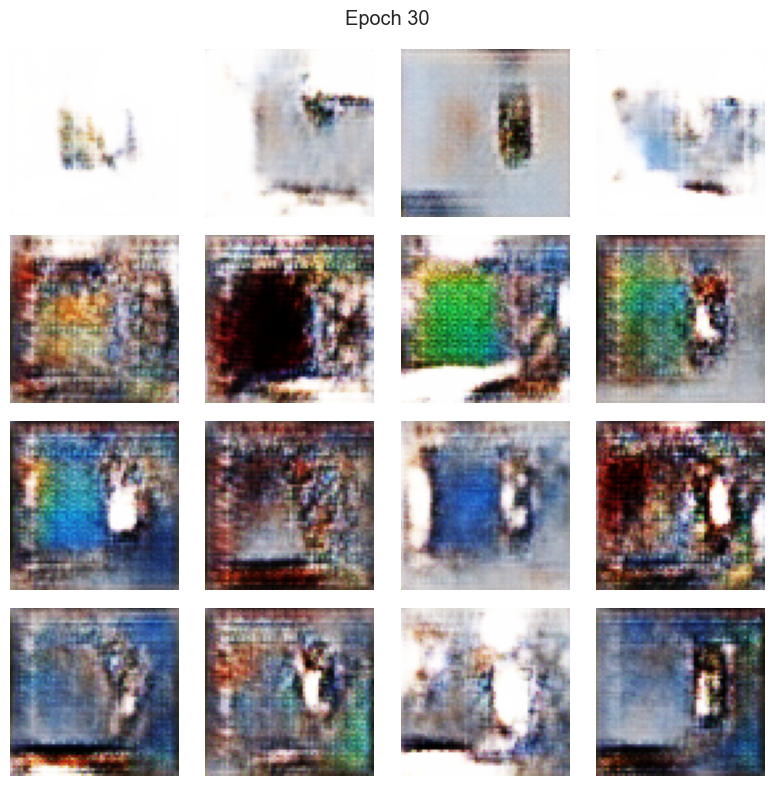

683/683 ━━━━━━━━━━━━━━━━━━━━ 10745s 16s/step - d_acc: 0.6656 - d_loss: 0.6447 - g_loss: 0.7353 - learning_rate: 2.0000e-04
Epoch 32/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 671ms/step - d_acc: 0.6508 - d_loss: 0.6519 - g_loss: 0.7194  
Epoch 32: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 458s 671ms/step - d_acc: 0.6514 - d_loss: 0.6525 - g_loss: 0.7283 - learning_rate: 2.0000e-04
Epoch 33/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 685ms/step - d_acc: 0.6487 - d_loss: 0.6472 - g_loss: 0.7326  
Epoch 33: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 468s 685ms/step - d_acc: 0.6499 - d_loss: 0.6490 - g_loss: 0.7342 - learning_rate: 2.0000e-04
Epoch 34/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 697ms/step - d_acc: 0.6525 - d_loss: 0.6436 - g_loss: 0.7396  
Epoch 34: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 476s 697ms/step - d_acc: 0.6571 - d_loss: 0.6471 - g_loss: 0.7266 - learning_rate: 2.0000e-04
Epoch 35/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 6

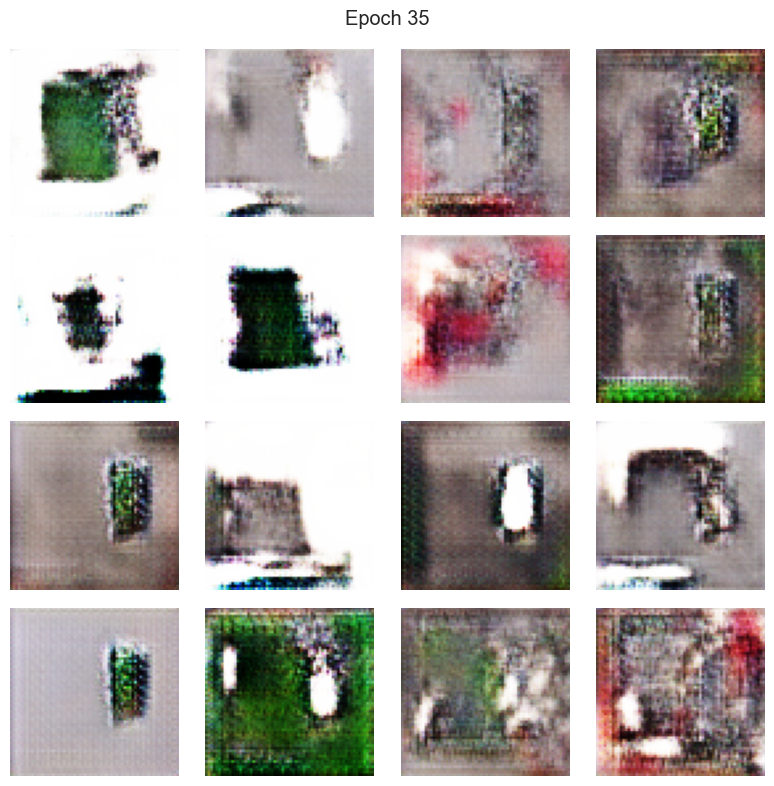

683/683 ━━━━━━━━━━━━━━━━━━━━ 477s 698ms/step - d_acc: 0.6652 - d_loss: 0.6445 - g_loss: 0.7318 - learning_rate: 2.0000e-04
Epoch 37/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 680ms/step - d_acc: 0.6727 - d_loss: 0.6385 - g_loss: 0.7343  
Epoch 37: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 464s 680ms/step - d_acc: 0.6658 - d_loss: 0.6404 - g_loss: 0.7413 - learning_rate: 2.0000e-04
Epoch 38/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 691ms/step - d_acc: 0.6640 - d_loss: 0.6408 - g_loss: 0.7321  
Epoch 38: g_loss did not improve from 0.65598

Epoch 38: ReduceLROnPlateau reducing learning rate to 4.0000001899898055e-05.
683/683 ━━━━━━━━━━━━━━━━━━━━ 472s 691ms/step - d_acc: 0.6615 - d_loss: 0.6444 - g_loss: 0.7296 - learning_rate: 2.0000e-04
Epoch 39/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 673ms/step - d_acc: 0.6522 - d_loss: 0.6482 - g_loss: 0.7267  
Epoch 39: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 460s 673ms/step - d_acc: 0.6577 - d_loss: 0.6463 - g_loss: 0.

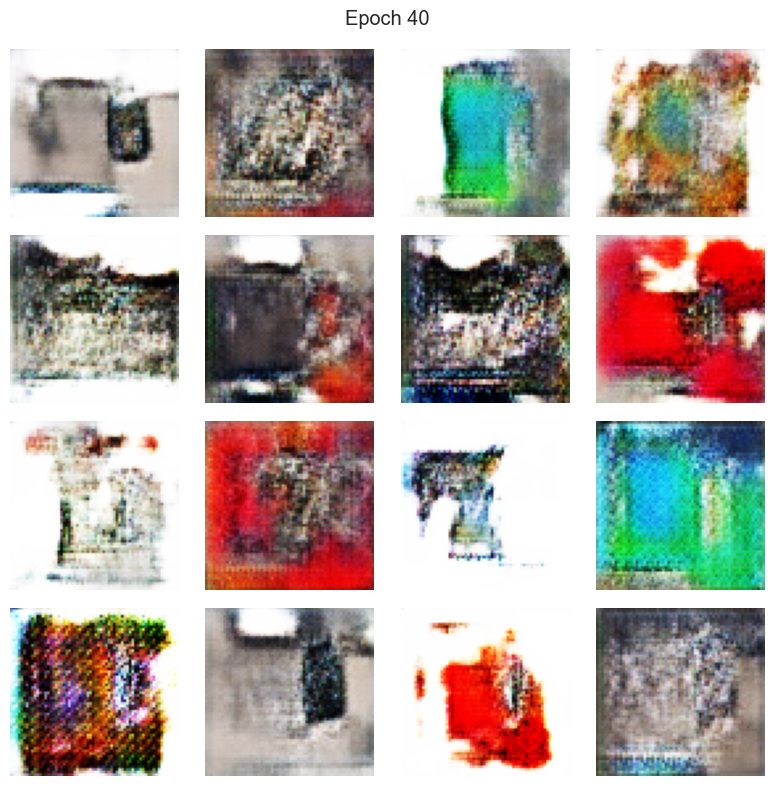

683/683 ━━━━━━━━━━━━━━━━━━━━ 477s 699ms/step - d_acc: 0.6691 - d_loss: 0.6398 - g_loss: 0.7428 - learning_rate: 4.0000e-05
Epoch 42/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 721ms/step - d_acc: 0.6685 - d_loss: 0.6388 - g_loss: 0.7373  
Epoch 42: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 517s 721ms/step - d_acc: 0.6697 - d_loss: 0.6375 - g_loss: 0.7455 - learning_rate: 4.0000e-05
Epoch 43/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 709ms/step - d_acc: 0.6747 - d_loss: 0.6369 - g_loss: 0.7490  
Epoch 43: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 484s 709ms/step - d_acc: 0.6669 - d_loss: 0.6392 - g_loss: 0.7494 - learning_rate: 4.0000e-05
Epoch 44/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 715ms/step - d_acc: 0.6630 - d_loss: 0.6341 - g_loss: 0.7471  
Epoch 44: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 488s 715ms/step - d_acc: 0.6621 - d_loss: 0.6354 - g_loss: 0.7558 - learning_rate: 4.0000e-05
Epoch 45/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 7

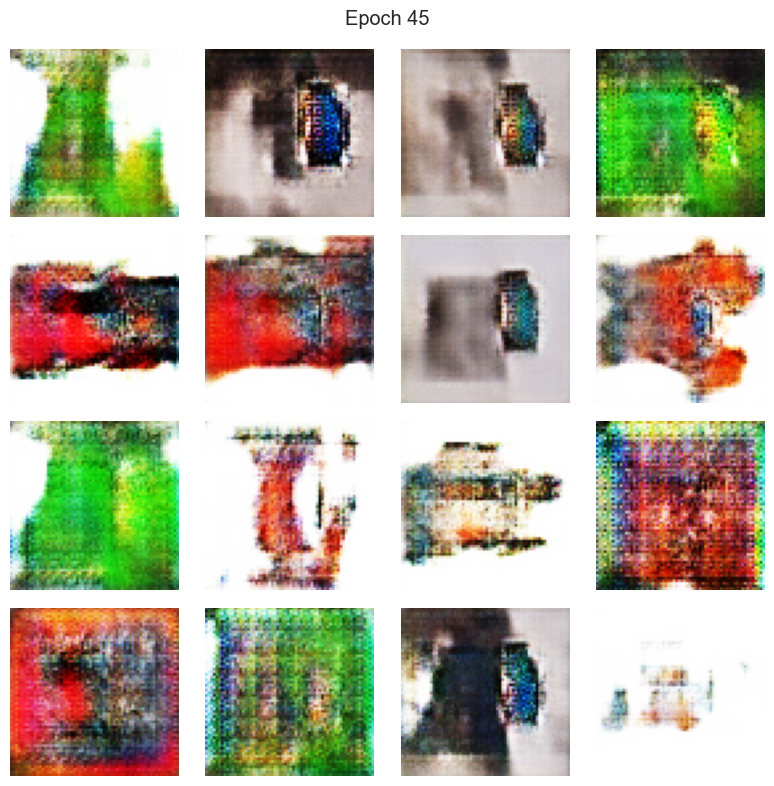

683/683 ━━━━━━━━━━━━━━━━━━━━ 494s 723ms/step - d_acc: 0.6565 - d_loss: 0.6381 - g_loss: 0.7452 - learning_rate: 4.0000e-05
Epoch 47/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 737ms/step - d_acc: 0.6603 - d_loss: 0.6361 - g_loss: 0.7554  
Epoch 47: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 512s 737ms/step - d_acc: 0.6593 - d_loss: 0.6372 - g_loss: 0.7519 - learning_rate: 4.0000e-05
Epoch 48/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - d_acc: 0.6580 - d_loss: 0.6371 - g_loss: 0.7389    7
Epoch 51: g_loss did not improve from 0.65598


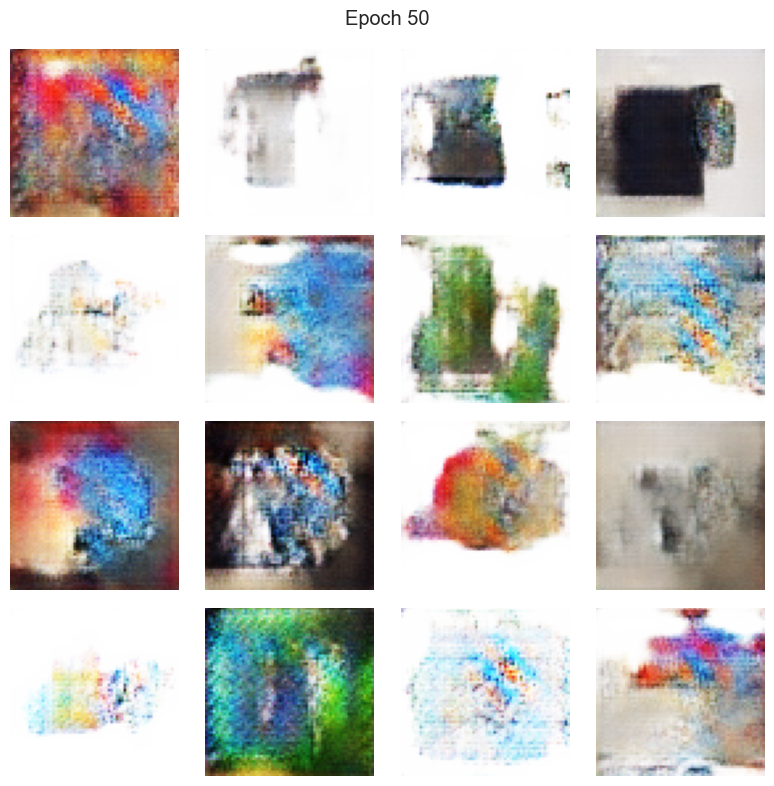

683/683 ━━━━━━━━━━━━━━━━━━━━ 6183s 9s/step - d_acc: 0.6583 - d_loss: 0.6375 - g_loss: 0.7408 - learning_rate: 4.0000e-05
Epoch 52/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - d_acc: 0.6652 - d_loss: 0.6370 - g_loss: 0.7445   42
Epoch 52: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 1444s 2s/step - d_acc: 0.6637 - d_loss: 0.6369 - g_loss: 0.7484 - learning_rate: 4.0000e-05
Epoch 53/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 452ms/step - d_acc: 0.6698 - d_loss: 0.6339 - g_loss: 0.7497  
Epoch 53: g_loss did not improve from 0.65598

Epoch 53: ReduceLROnPlateau reducing learning rate to 8.000000525498762e-06.
683/683 ━━━━━━━━━━━━━━━━━━━━ 308s 452ms/step - d_acc: 0.6659 - d_loss: 0.6356 - g_loss: 0.7536 - learning_rate: 4.0000e-05
Epoch 54/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 505ms/step - d_acc: 0.6696 - d_loss: 0.6390 - g_loss: 0.7464  
Epoch 54: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 345s 505ms/step - d_acc: 0.6704 - d_loss: 0.6361 - g_loss: 0.7476 

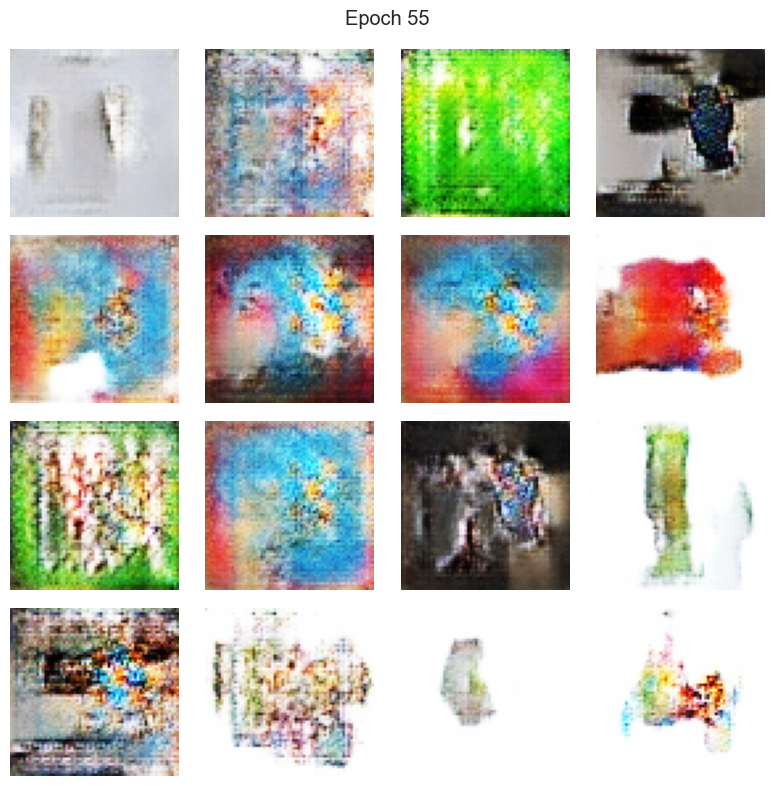

683/683 ━━━━━━━━━━━━━━━━━━━━ 361s 529ms/step - d_acc: 0.6707 - d_loss: 0.6368 - g_loss: 0.7484 - learning_rate: 8.0000e-06
Epoch 57/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 516ms/step - d_acc: 0.6638 - d_loss: 0.6371 - g_loss: 0.7327  
Epoch 57: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 353s 516ms/step - d_acc: 0.6640 - d_loss: 0.6381 - g_loss: 0.7352 - learning_rate: 8.0000e-06
Epoch 58/200
683/683 ━━━━━━━━━━━━━━━━━━━━ 0s 515ms/step - d_acc: 0.6622 - d_loss: 0.6385 - g_loss: 0.7397  
Epoch 58: g_loss did not improve from 0.65598
683/683 ━━━━━━━━━━━━━━━━━━━━ 352s 515ms/step - d_acc: 0.6553 - d_loss: 0.6398 - g_loss: 0.7377 - learning_rate: 8.0000e-06
Epoch 58: early stopping
Restoring model weights from the end of the best epoch: 8.

Temps d'entraînement total : 0j 16h 41m 01s
Modèle final sauvegardé sous: model_dct_gan_20251031_1048_final.keras


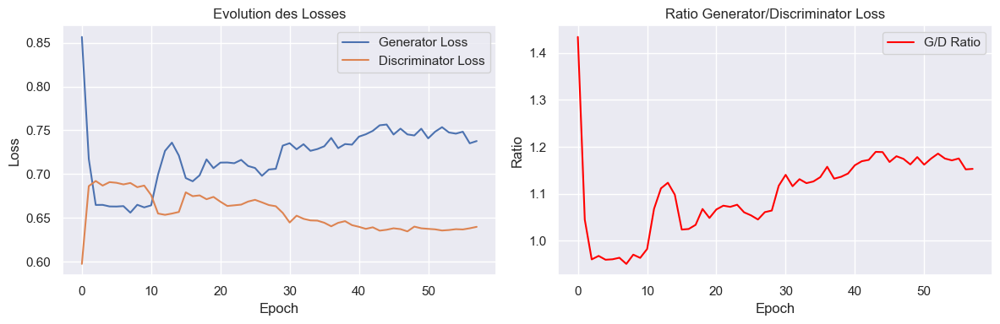


Génération d'images finales...
Erreur lors de la génération d'images finales: GAN.generate_images() got an unexpected keyword argument 'n'

RÉSUMÉ DE L'ENTRAÎNEMENT
Nombre d'epochs effectués: 58
Meilleure D_loss: 0.5974 (epoch 1)
Final G_loss: 0.7377
Final D_loss: 0.6398


In [19]:
import os
import time
import tensorflow as tf
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
import matplotlib.pyplot as plt
from datetime import datetime
import numpy as np

# ============================
# Scheduler et Optimizers
# ============================
initial_learning_rate_g = 5e-5
initial_learning_rate_d = 2e-5

d_schedule= tf.keras.optimizers.schedules.CosineDecayRestarts(
    initial_learning_rate=initial_learning_rate_d,
    first_decay_steps=1000,
    t_mul=2.0,
    m_mul=0.8,
    alpha=1e-5
)

g_schedule  = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_learning_rate_g,
    decay_steps=1000,
    decay_rate=0.95
)

# Initialisation du GAN
gan = GAN(discriminator=discriminator,
        generator=generator,
        latent_dim=LATENT_DIM)

gan.compile(
     g_optimizer=tf.keras.optimizers.Adam(initial_learning_rate_g , beta_1=0.5, beta_2=0.999),
    d_optimizer=tf.keras.optimizers.Adam(initial_learning_rate_d, beta_1=0.5, beta_2=0.999),
     loss_fn=keras.losses.BinaryCrossentropy()
)

# ============================
# Callbacks CORRIGÉS
# ============================
timestamp = datetime.now().strftime("%Y%m%d_%H%M")
model_path = f"model_dct_gan_{timestamp}.keras"

# Callback 1: Sauvegarde du meilleur modèle
param_surv_app1 = ModelCheckpoint(
    model_path, 
    monitor="g_loss", 
    verbose=1,
    save_best_only=True, 
    mode="min",
    save_weights_only=False
)

# Callback 2: Arrêt précoce
param_surv_app2 = EarlyStopping(
    monitor='g_loss', 
    patience=50,
    verbose=1, 
    mode="min",
    restore_best_weights=True,
    min_delta=1e-4
)

# Callback 3: Réduction du learning rate
param_surv_app3 = ReduceLROnPlateau(
    monitor='g_loss', 
    factor=0.2,
    patience=15, 
    verbose=1, 
    min_lr=1e-6,
    mode='min',
    min_delta=1e-4
)

# Callback 4: Sauvegarde périodique - CORRECTION ICI
checkpoint_dir = "training_checkpoints"
os.makedirs(checkpoint_dir, exist_ok=True)


param_surv_app6 = GANMonitor(num_img=16, latent_dim=LATENT_DIM, interval=5)

# ============================
# Entraînement
# ============================
print("Début de l'entraînement...")
print(f"Timestamp: {timestamp}")
print(f"Modèle sera sauvegardé sous: {model_path}")

start_time = time.time()

try:
    history = gan.fit(
        dataset,
        epochs=200,
        verbose=1,
        callbacks=[
            param_surv_app1, 
            param_surv_app2, 
            param_surv_app3, 
           # param_surv_app5,
            param_surv_app6
        ]
    )

except KeyboardInterrupt:
    print("\nEntraînement interrompu par l'utilisateur")
    
except Exception as e:
    print(f"\nErreur pendant l'entraînement: {e}")
    
finally:
    end_time = time.time()
    elapsed = end_time - start_time
    days, rem = divmod(elapsed, 86400)
    hours, rem = divmod(rem, 3600)
    minutes, seconds = divmod(rem, 60)

    print(f"\nTemps d'entraînement total : {int(days)}j {int(hours):02d}h {int(minutes):02d}m {int(seconds):02d}s")

    # Sauvegarde finale
    try:
        final_model_path = model_path.replace('.keras', '_final.keras')
        gan.save(final_model_path)
        print(f"Modèle final sauvegardé sous: {final_model_path}")
    except Exception as e:
        print(f"Erreur lors de la sauvegarde finale: {e}")

    # Visualisation de l'historique
    if 'history' in locals():
        try:
            plt.figure(figsize=(12, 4))
            
            plt.subplot(1, 2, 1)
            plt.plot(history.history['g_loss'], label='Generator Loss')
            plt.plot(history.history['d_loss'], label='Discriminator Loss')
            plt.title('Evolution des Losses')
            plt.xlabel('Epoch')
            plt.ylabel('Loss')
            plt.legend()
            plt.grid(True)
            
            plt.subplot(1, 2, 2)
            ratio = [g/d if d != 0 else 0 for g, d in zip(history.history['g_loss'], history.history['d_loss'])]
            plt.plot(ratio, label='G/D Ratio', color='red')
            plt.title('Ratio Generator/Discriminator Loss')
            plt.xlabel('Epoch')
            plt.ylabel('Ratio')
            plt.legend()
            plt.grid(True)
            
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Erreur lors de la visualisation: {e}")

    # Génération d'images finales
    print("\nGénération d'images finales...")
    try:
        final_images = gan.generate_images(n=8)
        
        final_img_path = f"final_images_{timestamp}.png"
        plt.figure(figsize=(16, 8))
        for i in range(min(8, len(final_images))):
            plt.subplot(2, 4, i + 1)
            plt.imshow(final_images[i])
            plt.axis('off')
            plt.title(f'Image {i+1}')
        plt.suptitle(f'Images générées finales - {timestamp}')
        plt.tight_layout()
        plt.savefig(final_img_path, dpi=150, bbox_inches='tight')
        plt.show()
        
        print(f"Images finales sauvegardées sous: {final_img_path}")
    except Exception as e:
        print(f"Erreur lors de la génération d'images finales: {e}")

# Résumé
print("\n" + "="*50)
print("RÉSUMÉ DE L'ENTRAÎNEMENT")
print("="*50)

if 'history' in locals():
    try:
        final_g_loss = history.history['g_loss'][-1]
        final_d_loss = history.history['d_loss'][-1]
        best_d_loss = min(history.history['d_loss'])
        best_epoch = history.history['d_loss'].index(best_d_loss) + 1
        
        print(f"Nombre d'epochs effectués: {len(history.history['g_loss'])}")
        print(f"Meilleure D_loss: {best_d_loss:.4f} (epoch {best_epoch})")
        print(f"Final G_loss: {final_g_loss:.4f}")
        print(f"Final D_loss: {final_d_loss:.4f}")
        
    except Exception as e:
        print(f"Erreur lors du calcul des statistiques: {e}")
else:
    print("Entraînement interrompu avant completion")

print("="*50)


In [28]:
from tensorflow.keras.models import load_model

In [60]:
np.max(X_train_)

np.float32(1.0)

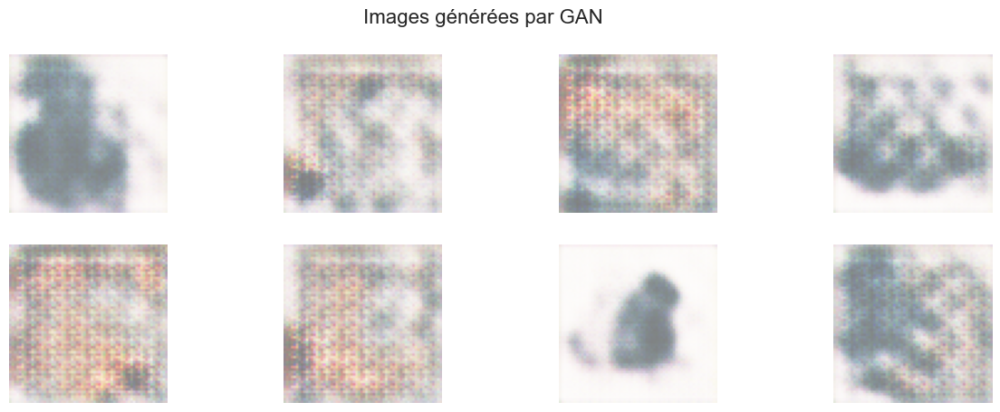

In [27]:
n_images = 8
latent_dim = 128
latent_vectors = tf.random.normal((n_images, latent_dim))
generated_images = gan.generate_images()

# --- Mise à l’échelle pour affichage ---
generated_images = (generated_images + 1.0) / 2.0  # remet entre 0 et 1

# --- Affichage ---
plt.figure(figsize=(15, 5))
for i in range(n_images):
    plt.subplot(2, 4, i + 1)
    plt.imshow(generated_images[i])
    plt.axis("off")
plt.suptitle("Images générées par GAN", fontsize=16)
plt.show()

tf.Tensor([[0.4999754]], shape=(1, 1), dtype=float32)


In [30]:
train_gan(generator, discriminator, gan, dataset)